# Probabilistic neural networks

* **Last Modified**: 07-04-2021
* **Authors**: Sam Budd
---

> Tutorial: Use probabilistic Flood extent segmentation models to measure Flood event uncertainty

## Step 0: Notebook setup
    - Configure notebook basics
    - Configure GCP Credentials

In [1]:
import sys, os
from pathlib import Path

%load_ext autoreload
%autoreload 2

## Step 1: Setup Configuration file
    - Load configuration file from local device or gcs

In [2]:
from ml4floods.models.config_setup import get_default_config
import pkg_resources

# Set filepath to configuration files
# config_fp = 'path/to/worldfloods_template.json'
config_fp = pkg_resources.resource_filename("ml4floods","models/configurations/worldfloods_uncertainty.json")

# config_fp = os.path.join(root, 'src', 'models', 'configurations', 'worldfloods_template.json')
config = get_default_config(config_fp)


Loaded Config for experiment:  worldfloods_uncertainty_demo
{   'data_params': {   'batch_size': 32,
                       'bucket_id': 'ml4floods',
                       'channel_configuration': 'all',
                       'filter_windows': {   'apply': False,
                                             'threshold_clouds': 0.8,
                                             'version': 'v1'},
                       'input_folder': 'S2',
                       'loader_type': 'local',
                       'num_workers': 8,
                       'path_to_splits': '/worldfloods/public',
                       'target_folder': 'gt',
                       'test_transformation': {'normalize': True},
                       'train_test_split_file': 'worldfloods/public/train_test_split.json',
                       'train_transformation': {'normalize': True},
                       'window_size': [256, 256]},
    'deploy': False,
    'experiment_name': 'worldfloods_uncertainty_demo',
    

## Step 2: Setup Dataloader
    - 'loader_type' can be one of 'local' which assumes the images are already saved locally, or 'bucket' which will load images directly from the bucket specified in 'bucket_id'

In [3]:
from ml4floods.models import dataset_setup

config.data_params.loader_type = 'local'
config.data_params.path_to_splits = "/worldfloods/public" # local folder to download the data
config.data_params["download"] = {"train": False, "val": False, "test": True} # download only test data

data_module = dataset_setup.get_dataset(config.data_params)

# Get just the test dataloader
dl = data_module.test_dataloader()

Using local dataset for this run
train 89741  tiles
val 1284  tiles
test 11  tiles


## Step 3: Load a pre-trained model or checkpoint
    - Currently models that support probabilistic segmentation include:
        1. 'unet_dropout' which achieves probabilistic segmentation via dropout during inference

In [4]:
from pytorch_lightning.utilities.cloud_io import load
from ml4floods.models.model_setup import get_model
import torch

print('Model type: ', config.model_params.hyperparameters.model_type)

path_to_models = f"{config.model_params.model_folder}/{config.experiment_name}/model.pt"

# Load probabilistic version of model for sampling varying predictions
prob_model = get_model(config.model_params)
prob_model.load_state_dict(load(path_to_models))
prob_model.to(torch.device("cuda:0"))

# Load deterministic version of model for sampling consistent predictions
det_model = get_model(config.model_params)
det_model.load_state_dict(load(path_to_models))
det_model.to(torch.device("cuda:0"))

Model type:  unet_dropout


WorldFloodsModel(
  (network): UNet_dropout(
    (dconv_down1): Sequential(
      (0): Conv2d(13, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
    (dconv_down2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
    (dconv_down3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
    (dconv_down4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(512, 512, kernel_size=(3, 3), stride=

## Step 4: Get Inference Function for model
    -- This handles tiling and padded prediction over large images and enables us to query multiple samples from the network to obtain uncertainty estimates 
    -- eval_mode=False enables dropout during inference to give us probabilistic samples from the network

In [ ]:
from ml4floods.models.model_setup import get_model_inference_function

# Get probabilistic and deterministic inference functions
prob_inference_function = get_model_inference_function(prob_model, config, apply_normalization=False, eval_mode=False)
det_inference_function = get_model_inference_function(det_model, config, apply_normalization=False, eval_mode=True)

## Step 5: Run probabilistic inference over dataset to show visual uncertainty of segmentations
    - compute_unecertainties function samples num_samples predictions from the model and builds several uncertainty maps for visualisation

  0%|          | 0/11 [00:00<?, ?it/s]

Getting model inference function
Max tile size: 1024
Getting model inference function
Max tile size: 1024


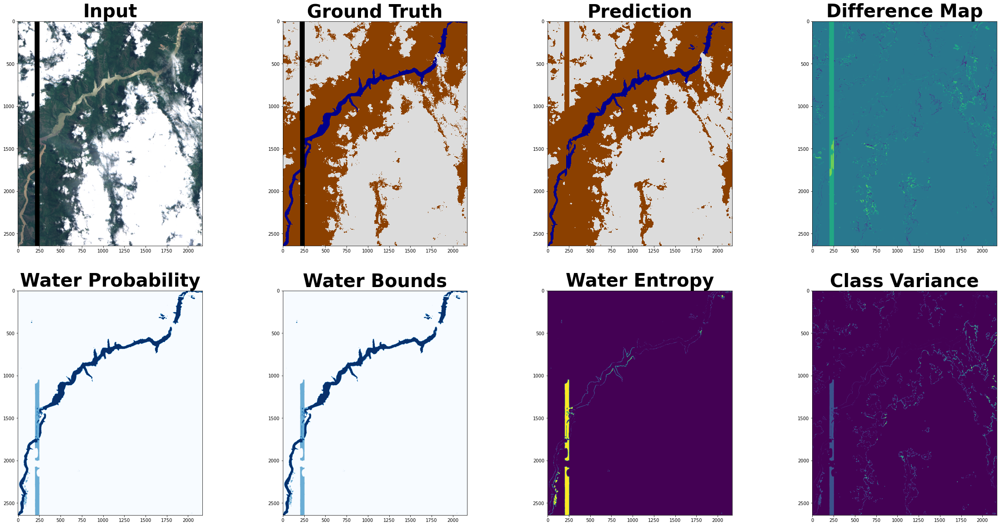

  9%|▉         | 1/11 [00:14<02:27, 14.78s/it]

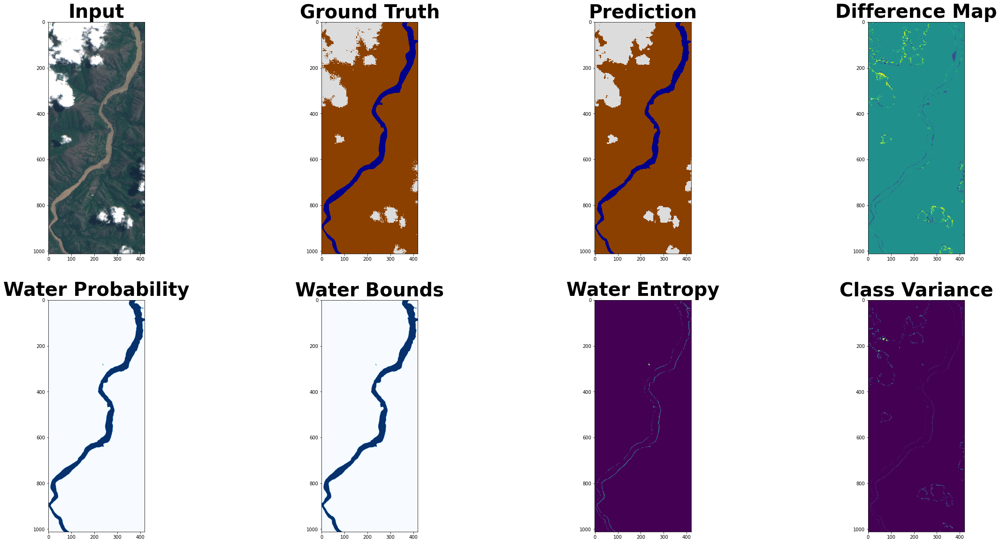

 18%|█▊        | 2/11 [00:16<01:04,  7.17s/it]

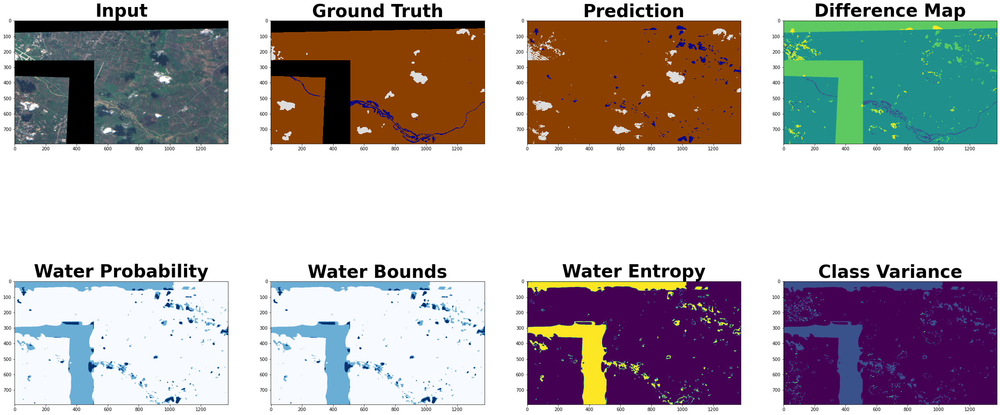

 27%|██▋       | 3/11 [00:20<00:44,  5.60s/it]

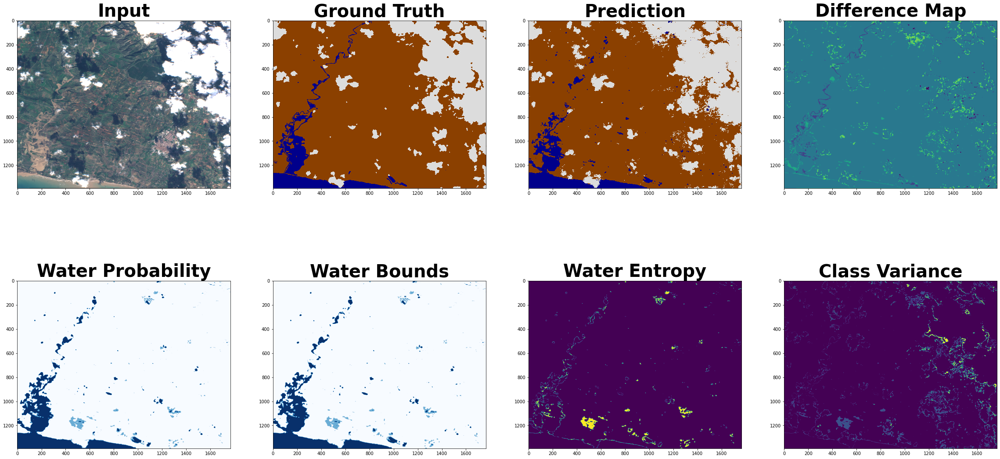

 36%|███▋      | 4/11 [00:27<00:44,  6.35s/it]

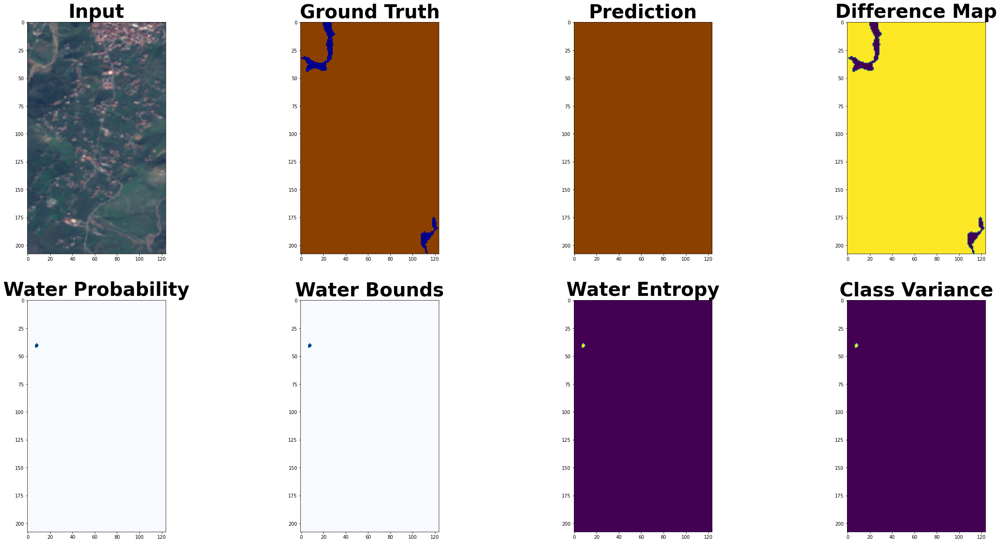

 45%|████▌     | 5/11 [00:29<00:27,  4.51s/it]

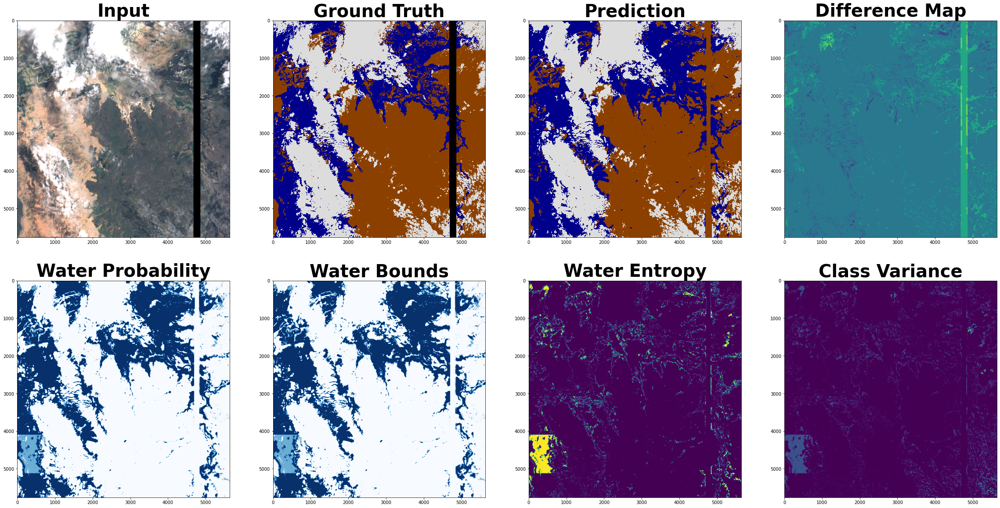

 55%|█████▍    | 6/11 [02:02<02:53, 34.65s/it]

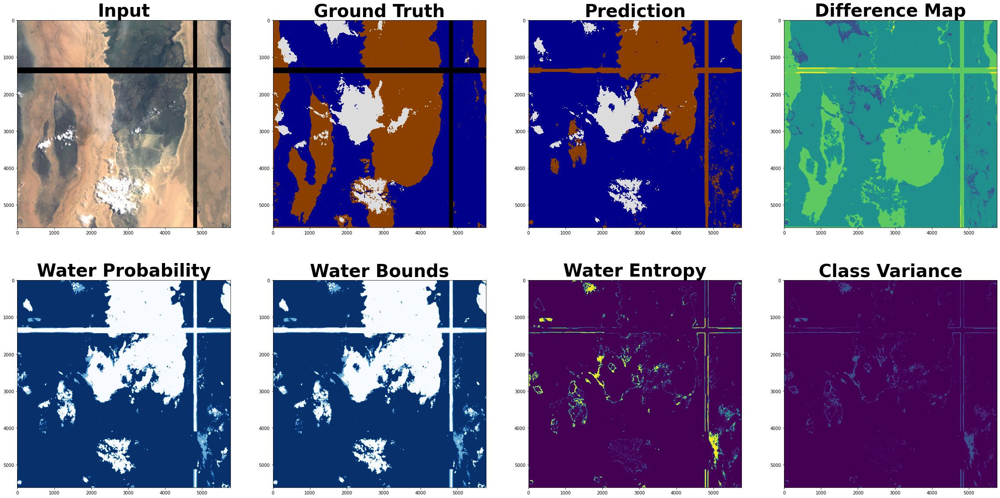

 64%|██████▎   | 7/11 [03:56<04:02, 60.59s/it]

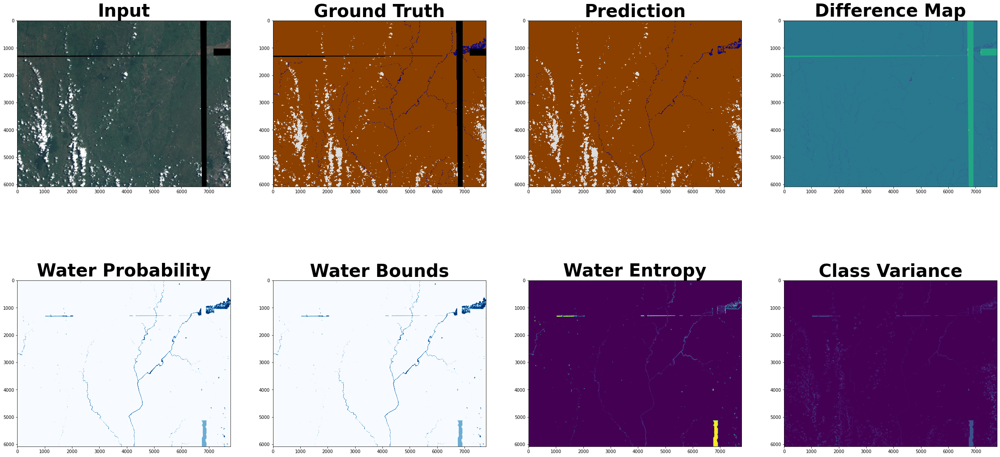

 73%|███████▎  | 8/11 [05:44<03:47, 75.81s/it]

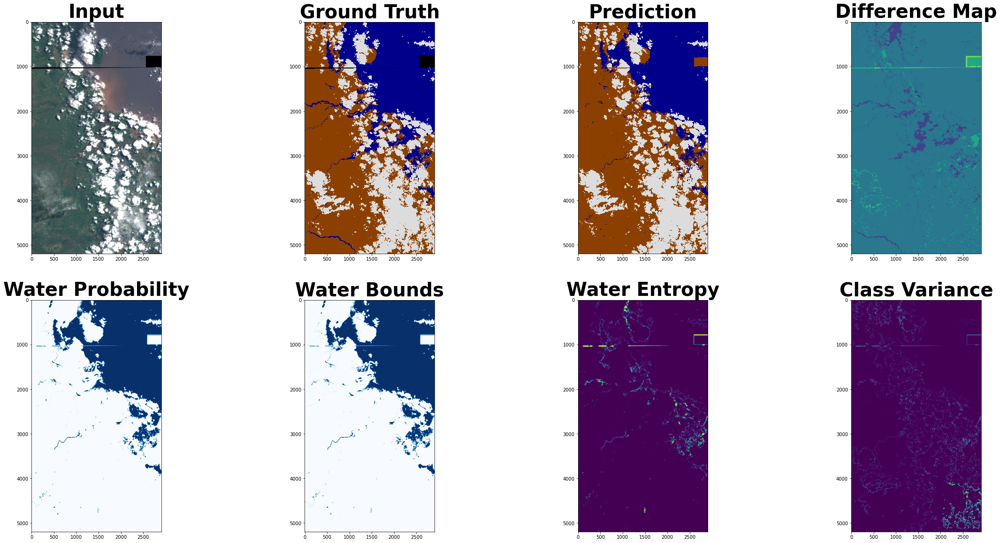

 82%|████████▏ | 9/11 [06:27<02:11, 65.55s/it]

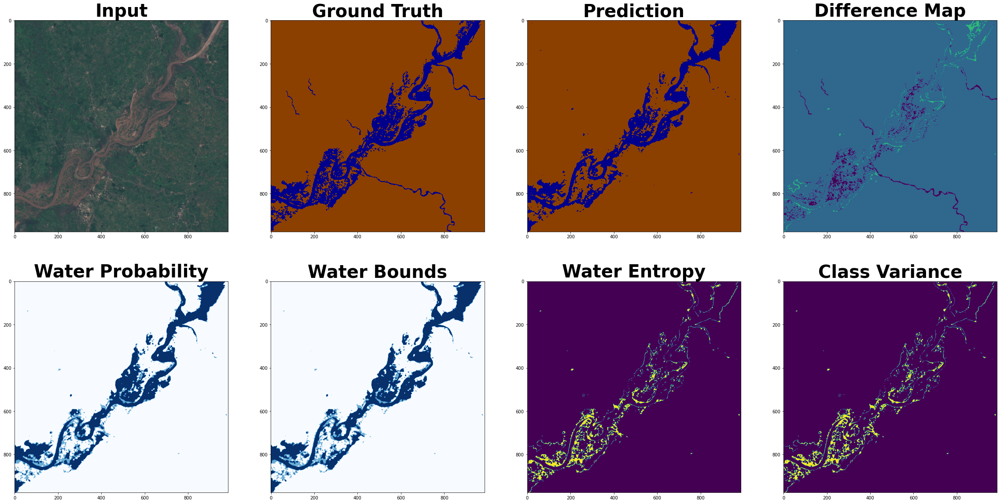

 91%|█████████ | 10/11 [06:30<00:46, 46.32s/it]

In [ ]:
from ml4floods.models.utils import uncertainty

uncertainty.compute_uncertainties(
    dataloader=dl, 
    p_pred_fun=prob_inference_function,
    d_pred_fun=det_inference_function,
    num_class=config.model_params.hyperparameters.num_classes,
    config=config,
    num_samples=2
)

## Step 6: Try it out on some new data!

In [8]:
import rasterio
import numpy as np
from rasterio import plot as rasterioplt
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.patches as mpatches

from typing import Optional, Tuple, Union

import torch
from ml4floods.data.worldfloods.configs import BANDS_S2


@torch.no_grad()
def read_inference_pair(tiff_inputs:str, folder_ground_truth:str, 
                        window:Optional[Union[rasterio.windows.Window, Tuple[slice,slice]]], 
                        return_ground_truth: bool=False, channels:bool=None, 
                        folder_permanent_water=Optional[str]) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, rasterio.Affine]:
    """
    Read a pair of layers from the worldfloods bucket and return them as Tensors to pass to a model, return the transform for plotting with lat/long
    
    Args:
        tiff_inputs: filename for layer in worldfloods bucket
        folder_ground_truth: folder name to be replaced by S2 in the input
        window: window of layer to use
        return_ground_truth: flag to indicate if paired gt layer should be returned
        channels: list of channels to read from the image
        return_permanent_water: Read permanent water layer raster
    
    Returns:
        (torch_inputs, torch_targets, transform): inputs Tensor, gt Tensor, transform for plotting with lat/long
    """
    
    tiff_targets = tiff_inputs.replace("/S2/", folder_ground_truth)

    with rasterio.open(tiff_inputs, "r") as rst:
        inputs = rst.read((np.array(channels) + 1).tolist(), window=window)
        # Shifted transform based on the given window (used for plotting)
        transform = rst.transform if window is None else rasterio.windows.transform(window, rst.transform)
        torch_inputs = torch.Tensor(inputs.astype(np.float32)).unsqueeze(0)
    
    if folder_permanent_water is not None:
        tiff_permanent_water = tiff_inputs.replace("/S2/", folder_permanent_water)
        with rasterio.open(tiff_permanent_water, "r") as rst:
            permanent_water = rst.read(1, window=window)  
            torch_permanent_water = torch.tensor(permanent_water)
    else:
        torch_permanent_water = torch.zeros_like(torch_inputs)
        
    if return_ground_truth:
        with rasterio.open(tiff_targets, "r") as rst:
            targets = rst.read(1, window=window)
        
        torch_targets = torch.tensor(targets).unsqueeze(0)
    else:
        torch_targets = torch.zeros_like(torch_inputs)
    
    return torch_inputs, torch_targets, torch_permanent_water, transform

COLORS_WORLDFLOODS = np.array([[0, 0, 0], # invalid
                               [139, 64, 0], # land
                               [0, 0, 139], # water
                               [220, 220, 220]], # cloud
                              dtype=np.float32) / 255

INTERPRETATION_WORLDFLOODS = ["invalid", "land", "water", "cloud"]

COLORS_WORLDFLOODS_PERMANENT = np.array([[0, 0, 0], # 0: invalid
                                         [139, 64, 0], # 1: land
                                         [237, 0, 0], # 2: flood_water
                                         [220, 220, 220], # 3: cloud
                                         [0, 0, 139], # 4: permanent_water
                                         [60, 85, 92]], # 5: seasonal_water
                                        dtype=np.float32) / 255

INTERPRETATION_WORLDFLOODS_PERMANENT = ["invalid", "land", "flood water", "cloud", "permanent water", "seasonal water"]

In [9]:
from ml4floods.models.model_setup import get_channel_configuration_bands
window = rasterio.windows.Window(col_off=1543, row_off=247,
                                 width=2000, height=2000)


tiff_s2, channels = "gs://ml4cc_data_lake/0_DEV/1_Staging/WorldFloods/S2/EMSR501/AOI01/EMSR501_AOI01_DEL_MONIT01_r1_v1.tif", get_channel_configuration_bands(config.model_params.hyperparameters.channel_configuration)

torch_inputs, torch_targets, torch_permanent_water, transform = read_inference_pair(tiff_s2, folder_ground_truth="/GT/V_1_1/", 
                                                                                    window=window, 
                                                                                    return_ground_truth=True, channels=channels,
                                                                                    folder_permanent_water="/JRC/")

Getting model inference function
Max tile size: 1024
Getting model inference function
Max tile size: 1024


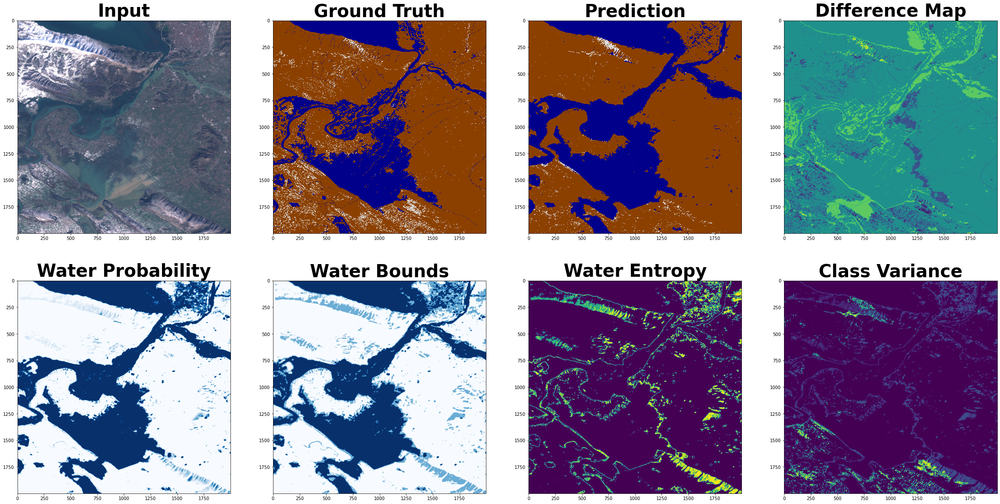

In [10]:
# Get probabilistic and deterministic inference functions
config.model_params.max_tile_size = 1024
prob_inference_function = get_model_inference_function(prob_model, config, apply_normalization=True, eval_mode=False)
det_inference_function = get_model_inference_function(det_model, config, apply_normalization=True, eval_mode=True)

uncertainty.compute_uncertainties_for_image_pair(
    torch_inputs, 
    torch_targets, 
    prob_inference_function, 
    det_inference_function,
    num_samples=10,
    num_class=config.model_params.hyperparameters.num_classes,
    config=config,
    denorm=False
)